# Importación de los Datos

In [1]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
import plotly.express as px
import plotly.graph_objects as go

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

## Análisis Exploratorio de los Datos EDA

In [2]:
ruta = r'C:\MachineLearning\Dataset\TornadosDataset\tornados.csv.zip'  
df = pd.read_csv(ruta)  
df.head(10)

,om,yr,mo,dy,date,time,tz,datetime_utc,st,stf,...,elon,len,wid,ns,sn,f1,f2,f3,f4,fc
0,192,1950,10,1,1950-10-01,21:00:00,America/Chicago,1950-10-02T03:00:00Z,OK,40,...,-102.30,15.8,10,1,1,25,0,0,0,False
1,193,1950,10,9,1950-10-09,02:15:00,America/Chicago,1950-10-09T08:15:00Z,NC,37,...,0.00,2.0,880,1,1,47,0,0,0,False
2,195,1950,11,20,1950-11-20,02:20:00,America/Chicago,1950-11-20T08:20:00Z,KY,21,...,0.00,0.1,10,1,1,177,0,0,0,False
3,196,1950,11,20,1950-11-20,04:00:00,America/Chicago,1950-11-20T10:00:00Z,KY,21,...,0.00,0.1,10,1,1,209,0,0,0,False
4,197,1950,11,20,1950-11-20,07:30:00,America/Chicago,1950-11-20T13:30:00Z,MS,28,...,0.00,2.0,37,1,1,101,0,0,0,False
5,194,1950,11,4,1950-11-04,17:00:00,America/Chicago,1950-11-04T23:00:00Z,PA,42,...,-75.93,15.9,100,1,1,71,11,0,0,False
6,198,1950,12,2,1950-12-02,15:00:00,America/Chicago,1950-12-02T21:00:00Z,IL,17,...,-89.72,18.8,50,1,1,119,117,0,0,False
7,199,1950,12,2,1950-12-02,16:00:00,America/Chicago,1950-12-02T22:00:00Z,IL,17,...,-89.38,18.0,200,1,1,119,5,0,0,False
8,200,1950,12,2,1950-12-02,16:25:00,America/Chicago,1950-12-02T22:25:00Z,AR,5,...,-91.72,7.8,10,1,1,65,0,0,0,False
9,201,1950,12,2,1950-12-02,17:30:00,America/Chicago,1950-12-02T23:30:00Z,IL,17,...,-89.62,9.6,50,1,1,157,0,0,0,False


In [3]:
df.shape

(68693, 27)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 68693 entries, 0 to 68692
Data columns (total 27 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   om            68693 non-null  int64  
 1   yr            68693 non-null  int64  
 2   mo            68693 non-null  int64  
 3   dy            68693 non-null  int64  
 4   date          68693 non-null  object 
 5   time          68693 non-null  object 
 6   tz            68693 non-null  object 
 7   datetime_utc  68693 non-null  object 
 8   st            68693 non-null  object 
 9   stf           68693 non-null  int64  
 10  mag           67937 non-null  float64
 11  inj           68693 non-null  int64  
 12  fat           68693 non-null  int64  
 13  loss          41523 non-null  float64
 14  slat          68693 non-null  float64
 15  slon          68693 non-null  float64
 16  elat          68693 non-null  float64
 17  elon          68693 non-null  float64
 18  len           68693 non-nu

| *Variable*  | *Clase*  | *Descripción en español*  |
|---------------|------------|-----------------------------|
| om          | Entero     | Número del tornado. Actúa como un ID para este tornado en este año. |
| yr          | Entero     | Año del tornado, de 1950 a 2022. |
| mo          | Entero     | Mes del tornado, de 1 a 12. |
| dy          | Entero     | Día del mes, de 1 a 31. |
| date        | Fecha      | Fecha del tornado. |
| time        | Hora       | Hora del tornado. |
| tz          | Nominal     | Zona horaria canonical basada en la base de datos de zonas horarias (tz). |
| datetime_utc| FechaHora  | Fecha y hora normalizada a UTC. |
| st          | Nominal     | Abreviatura postal de dos letras del estado (DC = Washington, DC; PR = Puerto Rico; VI = Islas Vírgenes). |
| stf         | Entero     | Número FIPS del estado (Código de Procesamiento Federal de Información). |
| mag         | Entero     | Magnitud en la escala F (EF desde 2007). Algunos valores son estimados (ver fc). |
| inj         | Entero     | Número de personas heridas. Para los totales estatales, use sn == 1 (ver abajo). |
| fat         | Entero     | Número de muertes. Para los totales estatales, use sn == 1 (ver abajo). |
| loss        | Decimal      | Estimación de la pérdida de propiedad en dólares. Antes de 1996, los valores fueron agrupados en rangos. El número reportado para esos años es el máximo de su rango. |
| slat        | Decimal      | Latitud de inicio en grados decimales. |
| slon        | Decimal      | Longitud de inicio en grados decimales. |
| elat        | Decimal      | Latitud final en grados decimales. |
| elon        | Decimal      | Longitud final en grados decimales. |
| len         | Decimal      | Longitud en millas. |
| wid         | Decimal      | Ancho en yardas. |
| ns          | Entero     | Número de estados afectados por este tornado. Puede ser 1, 2 o 3. |
| sn          | Entero     | Número de estado para esta fila. 1 significa que la fila contiene toda la información de la trayectoria para este estado, 0 significa que hay al menos una entrada más para este estado para este tornado (om + yr). |
| f1          | Entero     | Código FIPS para el primer condado. |
| f2          | Entero     | Código FIPS para el segundo condado. |
| f3          | Entero     | Código FIPS para el tercer condado. |
| f4          | Entero     | Código FIPS para el cuarto condado. |
| fc          | Lógico     | Indica si la columna mag fue estimada. |

In [5]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
om,68693.0,1.132018e+05,2.266220e+05,1.0000,285.00,588.0000,1118.00,6.220800e+05
yr,68693.0,1.991854e+03,1.956516e+01,1950.0000,1976.00,1995.0000,2008.00,2.022000e+03
mo,68693.0,5.968541e+00,2.444656e+00,1.0000,4.00,6.0000,7.00,1.200000e+01
dy,68693.0,1.593088e+01,8.750070e+00,1.0000,8.00,16.0000,24.00,3.100000e+01
stf,68693.0,2.922026e+01,1.501327e+01,1.0000,18.00,28.0000,42.00,7.800000e+01
mag,67937.0,7.787215e-01,8.957898e-01,0.0000,0.00,1.0000,1.00,5.000000e+00
inj,68693.0,1.418689e+00,1.811475e+01,0.0000,0.00,0.0000,0.00,1.740000e+03
fat,68693.0,8.931041e-02,1.472120e+00,0.0000,0.00,0.0000,0.00,1.580000e+02
loss,41523.0,2.020898e+06,3.039588e+07,50.0000,10000.00,50000.0000,500000.00,2.800100e+09
slat,68693.0,3.712939e+01,5.099005e+00,17.7212,33.18,37.0000,40.92,6.102000e+01


In [6]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Subconjunto de columnas numéricas para los histogramas
subset_columns = ['om', 'yr', 'mo', 'dy', 'stf', 'mag', 'inj', 'fat', 'loss', 
                  'slat', 'slon', 'elat', 'elon', 'len', 'wid', 'ns', 'sn', 'f1', 'f2', 'f3', 'f4']

# Número de columnas (4 por fila)
cols = 4
# Número de filas (en función del número de variables)
rows = len(subset_columns) // cols + (len(subset_columns) % cols > 0)

# Crear un gráfico de subgráficos
fig = make_subplots(
    rows=rows, cols=cols,  # Filas y columnas ajustadas
    shared_yaxes=True,  # Comparar las frecuencias en el eje y
    column_titles=subset_columns[:cols],  # Títulos para la primera fila
    row_titles=[f"Row {i+1}" for i in range(rows)],  # Títulos para las filas
    subplot_titles=subset_columns  # Los títulos de las variables en cada subgráfico
)

# Agregar histogramas a cada subgráfico
for i, col in enumerate(subset_columns, start=1):
    row = (i - 1) // cols + 1  # Calcular la fila (por ejemplo, el índice de fila)
    col_pos = (i - 1) % cols + 1  # Calcular la columna (por ejemplo, la posición en la fila)
    
    fig.add_trace(
        go.Histogram(
            x=df[col],
            nbinsx=20,  # Ajuste del número de bins
            name=col,
            marker_color='red',  # Color del histograma
            opacity=0.7
        ),
        row=row, col=col_pos
    )

# Actualizar las configuraciones del gráfico
fig.update_layout(
    title_text='Histograms of Selected Numeric Variables',
    showlegend=False,  # Ocultar la leyenda
    height=1200,  # Ajustar la altura del gráfico
    width=1500,  # Ajustar el ancho del gráfico
    title_x=0.5  # Centrar el título principal
)

# Mostrar el gráfico
fig.show()


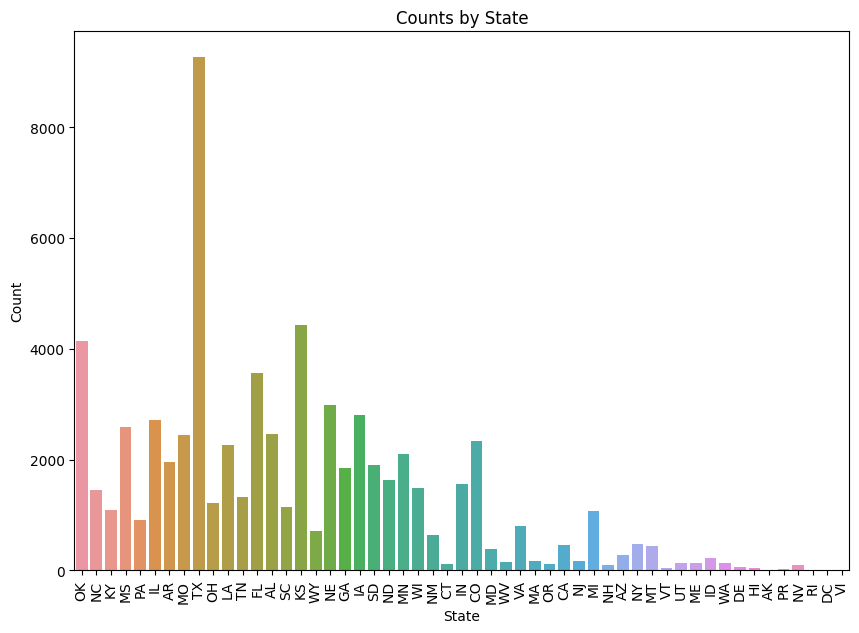

In [7]:
plt.figure(figsize=(10, 7))
sns.countplot(data=df, x='st')
plt.xlabel('State')
plt.ylabel('Count')
plt.title('Counts by State')
plt.xticks(rotation=90)
plt.show()

In [8]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Subconjunto de columnas numéricas para los boxplots
subset_columns = ['om', 'yr', 'mo', 'dy', 'stf', 'mag', 'inj', 'fat', 'loss', 
                  'slat', 'slon', 'elat', 'elon', 'len', 'wid', 'ns', 'sn', 'f1', 'f2', 'f3', 'f4']

# Número de columnas (4 por fila)
cols = 4
# Número de filas (en función del número de variables)
rows = len(subset_columns) // cols + (len(subset_columns) % cols > 0)

# Crear un gráfico de subgráficos
fig = make_subplots(
    rows=rows, cols=cols,  # Filas y columnas ajustadas
    shared_xaxes=True,  # Comparar las distribuciones en el eje x
    column_titles=subset_columns[:cols],  # Títulos para la primera fila
    row_titles=[f"Row {i+1}" for i in range(rows)],  # Títulos para las filas
    subplot_titles=subset_columns  # Los títulos de las variables en cada subgráfico
)

# Agregar boxplots horizontales a cada subgráfico
for i, col in enumerate(subset_columns, start=1):
    row = (i - 1) // cols + 1  # Calcular la fila (por ejemplo, el índice de fila)
    col_pos = (i - 1) % cols + 1  # Calcular la columna (por ejemplo, la posición en la fila)
    
    fig.add_trace(
        go.Box(
            x=df[col],  # Datos de la variable en el eje x para gráfico horizontal
            name=col,  # Nombre de la variable
            marker_color='black',  # Color del boxplot
            opacity=0.7,
            orientation='h'  # Orientación horizontal
        ),
        row=row, col=col_pos
    )

# Actualizar las configuraciones del gráfico
fig.update_layout(
    title_text='Horizontal Boxplots of Selected Numeric Variables',
    showlegend=False,  # Ocultar la leyenda
    height=1200,  # Ajustar la altura del gráfico
    width=1500,  # Ajustar el ancho del gráfico
    title_x=0.5  # Centrar el título principal
)

# Mostrar el gráfico
fig.show()


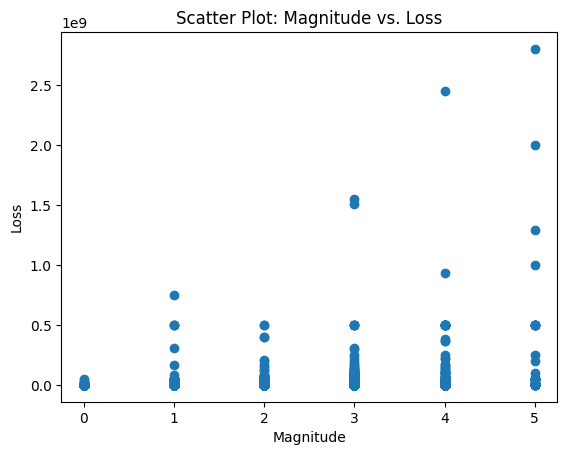

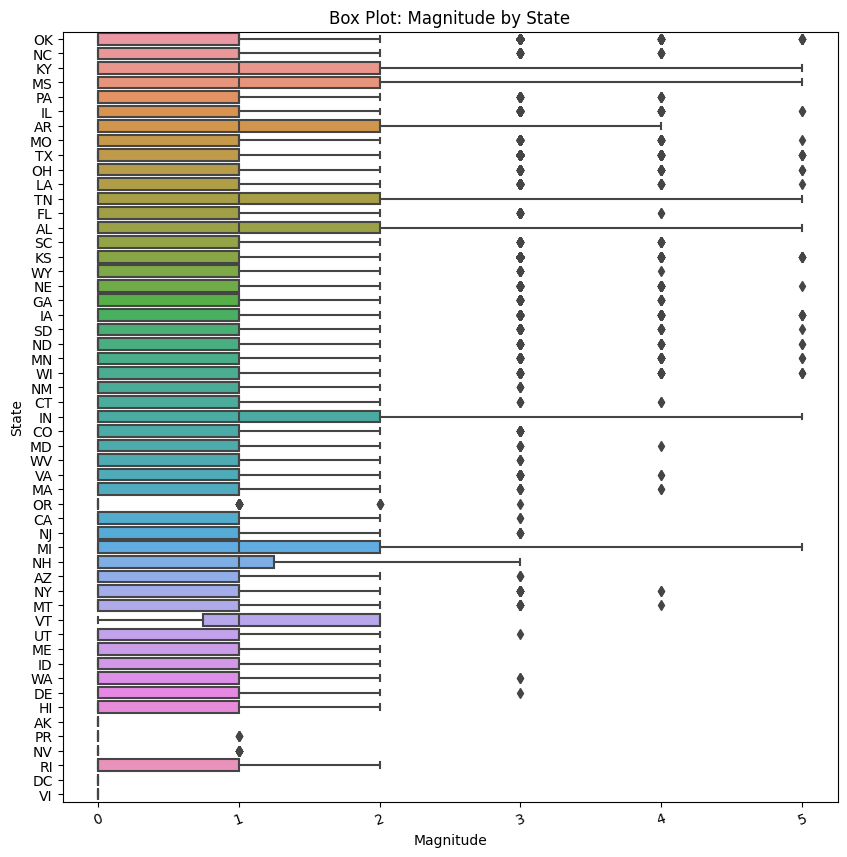

In [9]:

plt.scatter(df['mag'], df['loss'])
plt.xlabel('Magnitude')
plt.ylabel('Loss')
plt.title('Scatter Plot: Magnitude vs. Loss')
plt.show()


plt.figure(figsize=(10, 10))
sns.boxplot(data=df, y='st', x='mag')
plt.ylabel('State')
plt.xlabel('Magnitude')
plt.title('Box Plot: Magnitude by State')
plt.xticks(rotation=20)
plt.show()

In [10]:
df.isnull().sum()

om                  0
yr                  0
mo                  0
dy                  0
date                0
time                0
tz                  0
datetime_utc        0
st                  0
stf                 0
mag               756
inj                 0
fat                 0
loss            27170
slat                0
slon                0
elat                0
elon                0
len                 0
wid                 0
ns                  0
sn                  0
f1                  0
f2                  0
f3                  0
f4                  0
fc                  0
dtype: int64

In [11]:

df.dropna(inplace=True)

In [12]:
df['date'] = pd.to_datetime(df['date'])

df['date_numeric'] = (df['date'] - df['date'].min()).dt.days

In [13]:
df['time'] = pd.to_datetime(df['time'], format='%H:%M:%S')

df['time_numeric'] = df['time'].dt.hour * 3600 + df['time'].dt.minute * 60 + df['time'].dt.second

In [14]:

numeric_columns = ['om', 'yr', 'mo', 'dy', 'stf', 'mag', 'inj', 'fat', 'loss', 'slat', 'slon', 'elat', 'elon', 'len', 'wid', 'ns', 'sn', 'f1', 'f2', 'f3', 'f4']

numeric_df = df[numeric_columns]

correlation_matrix = numeric_df.corr()

print(correlation_matrix)

            om        yr        mo        dy       stf       mag       inj  \
om    1.000000  0.641333 -0.014129  0.038291  0.017673 -0.123721 -0.018815   
yr    0.641333  1.000000  0.011081  0.020438 -0.011882 -0.270327 -0.035231   
mo   -0.014129  0.011081  1.000000 -0.022037  0.017126 -0.053477 -0.023666   
dy    0.038291  0.020438 -0.022037  1.000000  0.007341 -0.010681 -0.009103   
stf   0.017673 -0.011882  0.017126  0.007341  1.000000  0.005377 -0.011306   
mag  -0.123721 -0.270327 -0.053477 -0.010681  0.005377  1.000000  0.230651   
inj  -0.018815 -0.035231 -0.023666 -0.009103 -0.011306  0.230651  1.000000   
fat  -0.007449 -0.027722 -0.025170 -0.003246 -0.009078  0.207488  0.757170   
loss  0.011247  0.019826 -0.009462 -0.001654 -0.005006  0.147667  0.528723   
slat -0.036809 -0.070104  0.057358 -0.002550  0.153543  0.065990 -0.003999   
slon  0.076815  0.108611  0.038201 -0.010476 -0.118155 -0.030855  0.017725   
elat  0.352794  0.512345 -0.021748  0.008169  0.012422  0.135053

<function matplotlib.pyplot.show(close=None, block=None)>

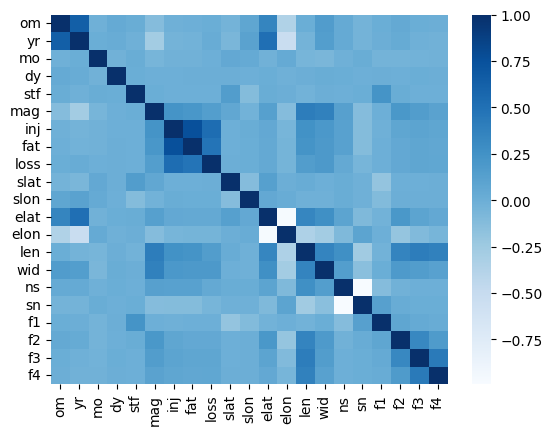

In [15]:
sns.heatmap(correlation_matrix,fmt='.2f',cmap='Blues')
plt.show

## Análisis Univariado

In [16]:
fig = px.pie(df, names='st', title='Distribution of States')
fig.show()

In [17]:
# Select a subset of numeric columns for pair plotting
subset_columns = ['mag', 'loss', 'len', 'wid', 'inj']

# Create a pair plot for selected columns
fig = px.scatter_matrix(df, dimensions=subset_columns, title='Pair Plot of Numeric Variables')
fig.show()

<Axes: xlabel='Total Loss (in 100 millions)$', ylabel='yr'>

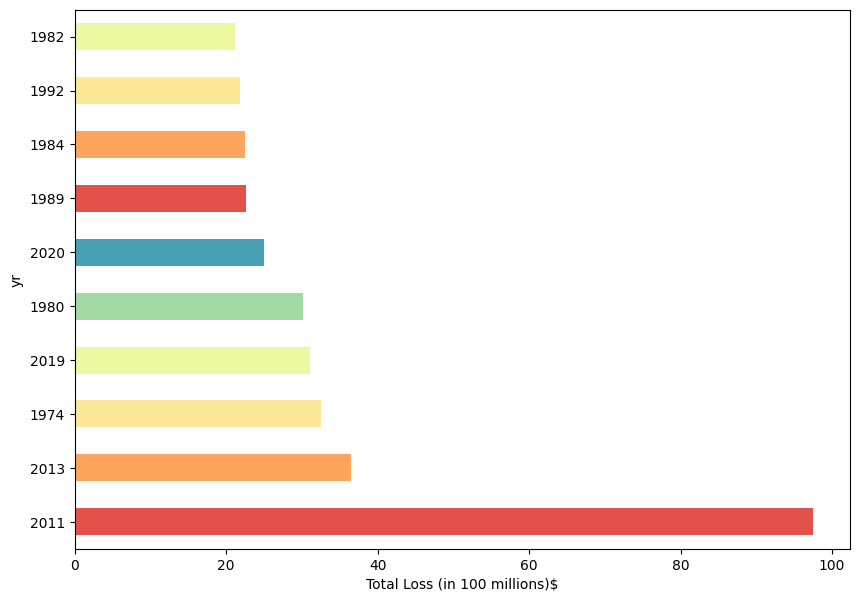

In [18]:
# count the injuries in each year and plot the highest 10
injuries_sorted_by_year = (df.groupby('yr')['loss'].sum()/ 100000000).sort_values(ascending=False)
injuries_sorted_by_year[:10].plot(kind='barh', color=sns.color_palette('Spectral'), figsize=(10, 7),  xlabel='Total Loss (in 100 millions)$')

In [19]:
fig = px.scatter_3d(df, x='mag', y='loss', z='len', color='fat', title='3D Scatter Plot: Magnitude vs. Loss vs. Length')
fig.show()

In [20]:
fig = px.scatter_geo(df, lat='slat', lon='slon', title='Geographic Scatter Plot')
fig.update_geos(projection_type='natural earth')
fig.show()